In [ ]:
pip install import-ipynb

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import sys
sys.path.append('/content/gdrive/Shared drives/ECE765 Group Project')
%cd /content/gdrive/Shared drives/ECE765 Group Project

/content/gdrive/Shared drives/ECE765 Group Project


In [ ]:
! pwd

In [ ]:
# importing libraries
import keras
import import_ipynb
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np
import torch
from torch.utils.data import Dataset, DataLoader
import DataPrep_CNN
import matplotlib.pyplot as plt


importing Jupyter notebook from DataPrep_CNN.ipynb
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
#Build Training Dataset

class TrainingDataset(Dataset):
    def __init__(self):
      self.preimages = read_training_data()
      self.images = normalized_images(self.preimages)
      self.labels = np.array([0] * 4739 + [1] * 4738)

    def __len__(self):
      return len(self.images)

    def __getitem__(self, idx):
      img = self.images[idx]
      label = self.labels[idx]
      return img, label

def trainDataset():
  train_dataset = TrainingDataset()
  return train_dataset

#Build Validation Dataset

class ValDataset(Dataset):
    def __init__(self):
      self.preimages = read_val_data()
      self.images = normalized_images(self.preimages)
      self.labels = np.array([0] * 500 + [1] * 500)

    def __len__(self):
      return len(self.images)

    def __getitem__(self, idx):
      img = self.images[idx]
      label = self.labels[idx]
      return img, label

def valDataset():
  val_dataset = ValDataset()
  return val_dataset

In [ ]:
trainImages = torch.load('/content/gdrive/Shared drives/ECE765 Group Project/trainImages_vae.pt')
valImages = torch.load('/content/gdrive/Shared drives/ECE765 Group Project/valImages_vae.pt')

In [ ]:
x = trainImages.images.numpy()
x_data = x[0:4738]
x_data = np.moveaxis(x,1,3)
x_data.shape

(9477, 128, 128, 3)

In [ ]:
plt.imshow(x_data[0])

In [ ]:
class Sampling(layers.Layer):
    """Uses (z_mean, z_log_var) to sample z, the vector encoding a digit."""

    def call(self, inputs):
        z_mean, z_log_var = inputs
        batch = tf.shape(z_mean)[0]
        dim = tf.shape(z_mean)[1]
        epsilon = tf.keras.backend.random_normal(shape=(batch, dim))
        return z_mean + tf.exp(0.5 * z_log_var) * epsilon

In [ ]:
# create convolution encoder and decoder
latent_dim = 128

encoder_inputs = keras.Input(shape=(128, 128, 3))
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(encoder_inputs)
x = layers.Conv2D(64, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2D(128, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Flatten()(x)
x = layers.Dense(16, activation="relu")(x)
z_mean = layers.Dense(latent_dim, name="z_mean")(x)
z_log_var = layers.Dense(latent_dim, name="z_log_var")(x)
z = Sampling()([z_mean, z_log_var])
encoder = keras.Model(encoder_inputs, [z_mean, z_log_var, z], name="encoder")
encoder.summary()

# convolutional decoder
latent_inputs = keras.Input(shape=(latent_dim,))
x = layers.Dense(16* 16 * 128, activation="relu")(latent_inputs)
x = layers.Reshape((16, 16, 128))(x)
x = layers.Conv2DTranspose(64, 2, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(32, 3, activation="relu", strides=2, padding="same")(x)
x = layers.Conv2DTranspose(16, 3, activation="relu", strides=2, padding="same")(x)
decoder_outputs = layers.Conv2DTranspose(3, 3, activation="sigmoid", padding="same")(x)
decoder = keras.Model(latent_inputs, decoder_outputs, name="decoder")
decoder.summary()

Model: "encoder"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_3 (InputLayer)            [(None, 128, 128, 3) 0                                            
__________________________________________________________________________________________________
conv2d_3 (Conv2D)               (None, 64, 64, 64)   1792        input_3[0][0]                    
__________________________________________________________________________________________________
conv2d_4 (Conv2D)               (None, 32, 32, 64)   36928       conv2d_3[0][0]                   
__________________________________________________________________________________________________
conv2d_5 (Conv2D)               (None, 16, 16, 128)  73856       conv2d_4[0][0]                   
____________________________________________________________________________________________

In [ ]:
class VAE(keras.Model):
    def __init__(self, encoder, decoder, **kwargs):
        super(VAE, self).__init__(**kwargs)
        self.encoder = encoder
        self.decoder = decoder

    def train_step(self, data):
        if isinstance(data, tuple):
            data = data[0]
        with tf.GradientTape() as tape:
            z_mean, z_log_var, z = encoder(data)
            reconstruction = decoder(z)
            reconstruction_loss = tf.reduce_mean(keras.losses.mean_squared_error(data, reconstruction))
            reconstruction_loss *= 3072
            kl_loss = 1 + z_log_var - tf.square(z_mean) - tf.exp(z_log_var)
            kl_loss = tf.reduce_mean(kl_loss)
            kl_loss *= -0.5
            beta = 0.1
            total_loss = reconstruction_loss + kl_loss
        grads = tape.gradient(total_loss, self.trainable_weights)
        self.optimizer.apply_gradients(zip(grads, self.trainable_weights))
        return {
            "loss": total_loss,
            "reconstruction_loss": reconstruction_loss,
            "kl_loss": kl_loss,
        }

In [ ]:
vae = VAE(encoder, decoder)
vae.compile(optimizer=keras.optimizers.Adam())
history = vae.fit(x_data, epochs=20, batch_size=64)
vae.save_weights("vae_model128_orig.h5",save_format='h5')

Epoch 1/20
149/149 [==============================] - 8s 51ms/step - loss: 2930.1330 - reconstruction_loss: 2922.3982 - kl_loss: 7.7347
Epoch 2/20
149/149 [==============================] - 8s 50ms/step - loss: 2603.3132 - reconstruction_loss: 2601.0506 - kl_loss: 2.2625
Epoch 3/20
149/149 [==============================] - 8s 51ms/step - loss: 2552.6729 - reconstruction_loss: 2550.4845 - kl_loss: 2.1884
Epoch 4/20
149/149 [==============================] - 8s 52ms/step - loss: 2503.9398 - reconstruction_loss: 2501.8006 - kl_loss: 2.1392
Epoch 5/20
149/149 [==============================] - 8s 52ms/step - loss: 2489.2463 - reconstruction_loss: 2487.1923 - kl_loss: 2.0540
Epoch 6/20
149/149 [==============================] - 8s 52ms/step - loss: 2464.7993 - reconstruction_loss: 2462.6985 - kl_loss: 2.1008
Epoch 7/20
149/149 [==============================] - 8s 51ms/step - loss: 2453.2887 - reconstruction_loss: 2451.1638 - kl_loss: 2.1249
Epoch 8/20
149/149 [============================

In [ ]:
vae.save_weights("/content/gdrive/Shared drives/ECE765 Group Project/vae_model128_orig.hdf5",save_format='h5')

In [ ]:
recon_loss = history.history['reconstruction_loss']
epochs = range(0,5)
plt.plot(epochs, recon_loss, 'b', label='Reconstruction loss')
#plt.plot(epochs, loss_val, 'b', label='validation loss')
plt.title('Training and Validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
#valImages.images
losses = []
count 0
for image in valImages.images:
  
  image = image.numpy()
  image = np.moveaxis(image,0,2)
  image = image.reshape(1,128,128,3)
  encoded = encoder.predict(image)
  reconstruction =  decoder.predict(encoded)

  loss = (tf.reduce_mean(keras.losses.mean_squared_error(image, reconstruction)) * 3072).numpy()
  losses.append(loss)
  count += 1
  if count % 10 == 0:
    print(count)


In [ ]:
count1 = sum(i > 2365 for i in losses[0:500])
count2 = sum(i < 2365 for i in losses[500:])
print('Accuracy: ' + str((count1 + count2)/1000))
print('Average reconstruction loss on dogs: '+ str(np.mean(losses[0:499])))
print('Average reconstruction loss on non-dogs: ' + str(np.mean(losses[500:])))

Accuracy: 0.639
Average reconstruction loss on dogs: 2901.2527
Average reconstruction loss on non-dogs: 2247.3806


Text(0.5, 0, 'Image')

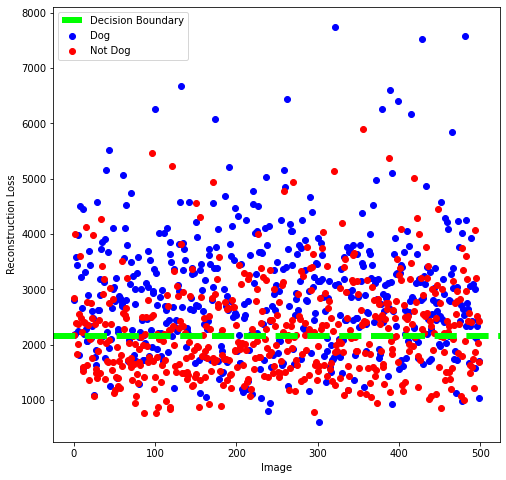

In [ ]:
fig1 = plt.figure(figsize=(8,8))
ax = plt.scatter(y = losses[0:500], x = range(0,500), color='b', label = 'Dog')  #dogs
ax1 = plt.scatter(y = losses[500:], x = range(0,500), color='r', label = 'Not Dog')  #not dogs
plt.axhline(y=2150, color='lime', linestyle='--', linewidth=6, label="Decision Boundary")
plt.legend()
plt.ylabel('Reconstruction Loss')
plt.xlabel('Image')


In [ ]:
# get best reconstructed image
count = 0
best_loss = 10000000000
best_indeces = []
for image in trainImages.images[1500:2000]:
  image = image.numpy()
  image = np.moveaxis(image,0,2)
  image = image.reshape(1,128,128,3)
  encoded = encoder.predict(image)
  reconstruction =  decoder.predict(encoded)

  loss = (tf.reduce_mean(keras.losses.mean_squared_error(image, reconstruction)) * 100).numpy()
  if loss < best_loss:
    best_loss = loss
    best_index = count
  
  count += 1
  if count % 100 == 0:
    print(count)


100
200
300
400
500


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

KeyboardInterrupt: ignored

Error in callback <function install_repl_displayhook.<locals>.post_execute at 0x7fc1fc674d08> (for post_execute):


KeyboardInterrupt: ignored

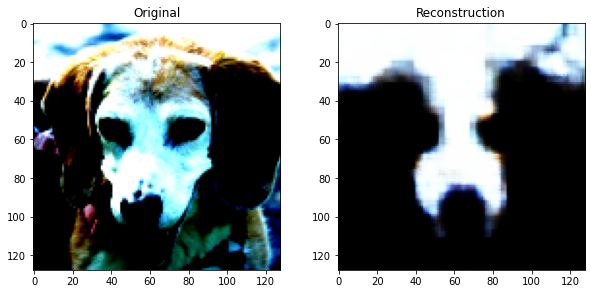

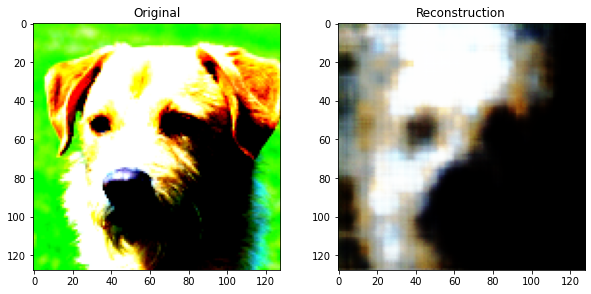

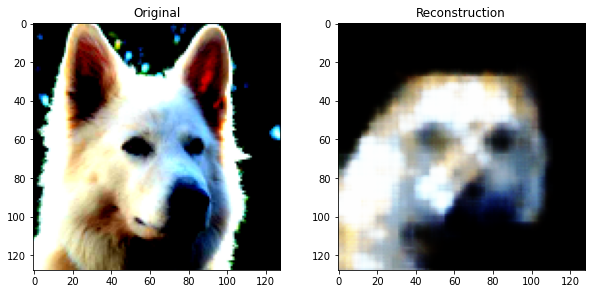

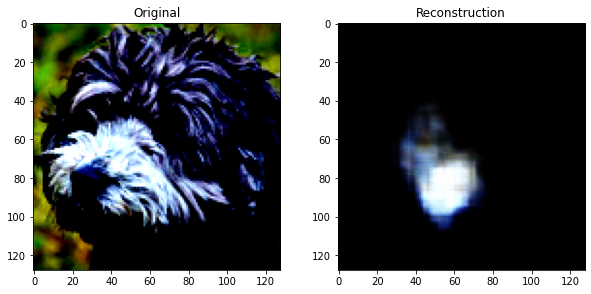

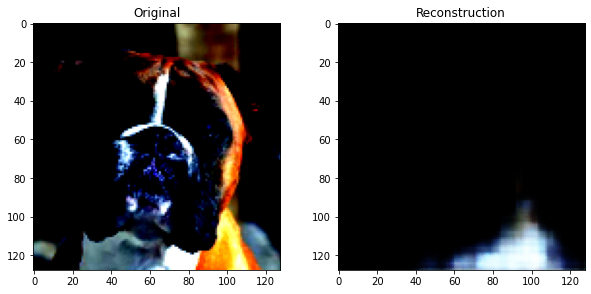

...

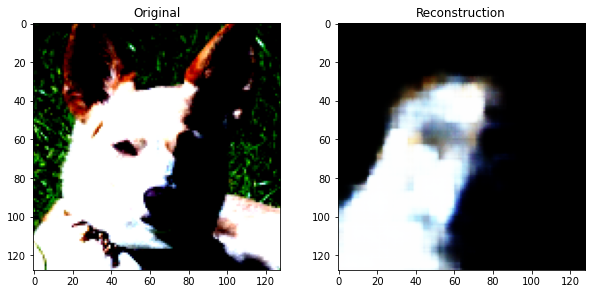

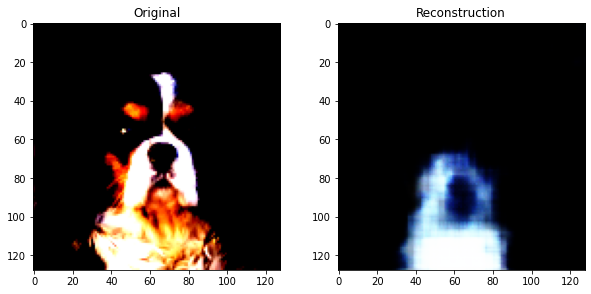

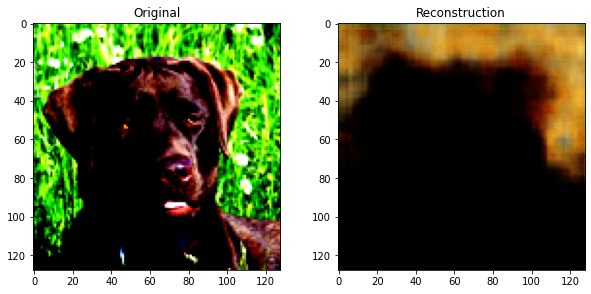

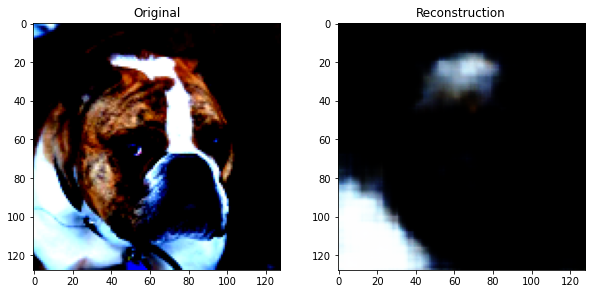

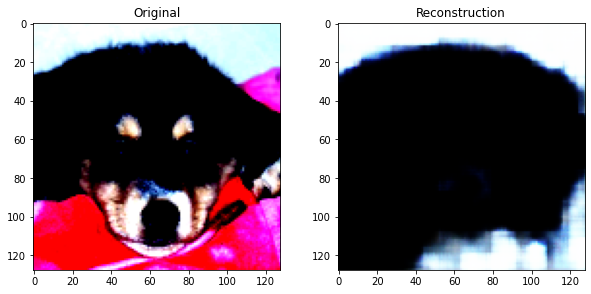

In [ ]:
#image = trainImages.images[4]
for image in trainImages.images:
  image = image.numpy()
  image = np.moveaxis(image,0,2)
  image = image.reshape(1,128,128,3)
  encoded = encoder.predict(image)
  reconstruction =  decoder.predict(encoded)
  fig = plt.figure(figsize=(10,10))
  ax1 = fig.add_subplot(221)
  ax1.title.set_text('Original')
  plt.imshow(np.squeeze(image))
  ax2 = fig.add_subplot(222)
  ax2.title.set_text('Reconstruction')
  plt.imshow(np.squeeze(reconstruction))

In [ ]:
best_index

899